<a href="https://colab.research.google.com/github/kkettip/diabetes_dataset/blob/main/Cleaned_Diabetes_Dataset%2C_550_Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Data Dictionary

Columns

1) encounter_id: A unique identifier for each encounter or interaction with the healthcare
system.

2) patient_nbr: A unique identifier for each patient.

3) race: The race or ethnicity of the
patient.

4) gender: The gender of the patient.

5) age: The age of the patient at the time of encounter.

6) weight: The weight of the patient.

7) admission_type_id: Identifier for admission type (e.g., emergency, urgent, elective).

8) discharge_disposition_id: Identifier for discharge disposition (e.g., home, transfer, expired).

9) admission_source_id: Identifier for admission source (e.g., physician referral, emergency room).

10) time_in_hospital: Number of days the patient spent in the hospital during this encounter.

11) payer_code: Code for the payer (e.g., insurance company) responsible for covering the cost of the encounter.

12) medical_specialty: The specialty of the physician who admitted the patient.

13) num_lab_procedures: Number of lab
procedures the patient underwent during the encounter.

14) num_procedures: Number of nonlab procedures the patient underwent during the encounter.

15) num_medications: Number of
distinct medications the patient was prescribed during the encounter.

16) number_outpatient:
Number of outpatient visits the patient had in the year preceding the encounter.

17) number_emergency: Number of emergency visits the patient had in the year preceding the encounter.

18) number_inpatient: Number of inpatient visits the patient had in the year
preceding the encounter.

19) diag_1, diag_2, diag_3: Primary, secondary, and tertiary diagnoses
respectively.

20) number_diagnoses: Number of diagnoses entered to the system.

21) max_glu_serum: Indicates the result of the max glucose serum test.

22) A1Cresult: Indicates the
result of the A1C test.

23) Medication Columns (indicates whether patient was prescribed the medication, increase in dosage, no dosage increase and steady dosage during the encounter): metformin, repaglinide, nateglinide, chlorpropamide, glimepiride, acetohexamide, glipizide, glyburide, tolbutamide, pioglitazone, rosiglitazone, acarbose, miglitol, troglitazone, tolazamide, examide, citoglipton, insulin, glyburide-metformin, glipizidemetformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone

24) change: Indicates if there was a change
in diabetic medications.

25) diabetesMed: Indicates if there was any diabetic medication prescribed.

26) readmitted: Indicates if the patient was readmitted to the hospital within 30 days of the encounter.


#Install and Import Libraries

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 8.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd   # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np   # linear algebra
import matplotlib.pyplot as plt  #graphs and plots
import seaborn as sns   #data visualizations
import csv # Some extra functionalities for csv  files - reading it as a dictionary
from lightgbm import LGBMClassifier #sklearn is for machine learning and statistical modeling including classification, regression, clustering and dimensionality reduction

from sklearn.model_selection import train_test_split, cross_validate   #break up dataset into train and test sets

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler


# importing python library for working with missing data
import missingno as msno
# To install missingno use: !pip install missingno
import re    # This library is used to perform regex pattern matching

# import various functions from sklearn
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split



In [ ]:
import plotly
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings("ignore")


#Loading csv

In [ ]:
diabetes = pd.read_csv('https://raw.githubusercontent.com/kkettip/diabetes_dataset/main/diabetic_data.csv', index_col=0)
diabetes.head(10)

,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,
2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,?,...,No,No,No,No,No,No,No,No,No,NO
149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,?,...,No,Up,No,No,No,No,No,Ch,Yes,>30
64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,?,...,No,No,No,No,No,No,No,No,Yes,NO
500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,?,...,No,Up,No,No,No,No,No,Ch,Yes,NO
16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,?,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
35754,82637451,Caucasian,Male,[50-60),?,2,1,2,3,?,...,No,Steady,No,No,No,No,No,No,Yes,>30
55842,84259809,Caucasian,Male,[60-70),?,3,1,2,4,?,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
63768,114882984,Caucasian,Male,[70-80),?,1,1,7,5,?,...,No,No,No,No,No,No,No,No,Yes,>30
12522,48330783,Caucasian,Female,[80-90),?,2,1,4,13,?,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


#Clean dataset

Replacing '?' with NaN.

In [ ]:
new_df = diabetes.replace(['?'], np.nan)
new_df

,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,
2278392,8222157,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,...,No,No,No,No,No,No,No,No,No,NO
149190,55629189,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,...,No,Up,No,No,No,No,No,Ch,Yes,>30
64410,86047875,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,...,No,No,No,No,No,No,No,No,Yes,NO
500364,82442376,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,...,No,Up,No,No,No,No,No,Ch,Yes,NO
16680,42519267,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443847548,100162476,AfricanAmerican,Male,[70-80),NaN,1,3,7,3,MC,...,No,Down,No,No,No,No,No,Ch,Yes,>30
443847782,74694222,AfricanAmerican,Female,[80-90),NaN,1,4,5,5,MC,...,No,Steady,No,No,No,No,No,No,Yes,NO
443854148,41088789,Caucasian,Male,[70-80),NaN,1,1,7,1,MC,...,No,Down,No,No,No,No,No,Ch,Yes,NO


In [ ]:
new_df.columns

Index(['patient_nbr', 'race', 'gender', 'age', 'weight', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'payer_code', 'medical_specialty', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'max_glu_serum', 'A1Cresult', 'metformin',
       'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

#Check for missing values.

Check columns, data types and null values. Identify columns with missing values.

In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101766 entries, 2278392 to 443867222
Data columns (total 49 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   patient_nbr               101766 non-null  int64 
 1   race                      99493 non-null   object
 2   gender                    101766 non-null  object
 3   age                       101766 non-null  object
 4   weight                    3197 non-null    object
 5   admission_type_id         101766 non-null  int64 
 6   discharge_disposition_id  101766 non-null  int64 
 7   admission_source_id       101766 non-null  int64 
 8   time_in_hospital          101766 non-null  int64 
 9   payer_code                61510 non-null   object
 10  medical_specialty         51817 non-null   object
 11  num_lab_procedures        101766 non-null  int64 
 12  num_procedures            101766 non-null  int64 
 13  num_medications           101766 non-null  int64 


In [ ]:
def missing (new_df):
    missing_number = new_df.isnull().sum().sort_values(ascending=False)
    missing_percent = (new_df.isnull().sum()/new_df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

missing(new_df)

,Missing_Number,Missing_Percent
weight,98569,0.968585
medical_specialty,49949,0.490822
payer_code,40256,0.395574
race,2273,0.022336
diag_3,1423,0.013983
diag_2,358,0.003518
diag_1,21,0.000206
patient_nbr,0,0.000000
troglitazone,0,0.000000
glyburide,0,0.000000


In [ ]:
#Check for amount missing
new_df.isnull().sum()

patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide                   0
glipizide     

Columns with missing values are race, weight, payer_code, medical_specialty, diag_1, diag_2 and diag_3.

Visualizing the missing data

<Axes: >

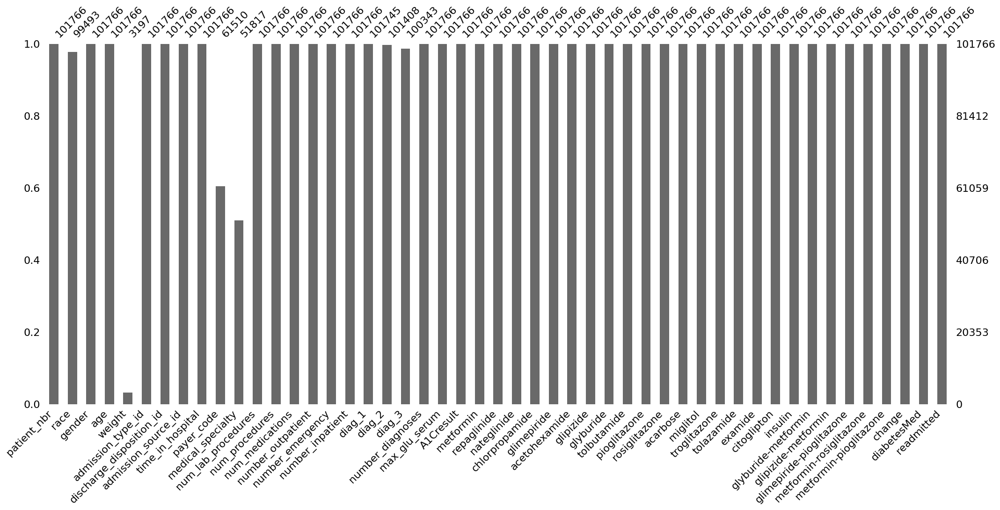

In [ ]:
# Visualizing the missing data
msno.bar(new_df)

<Axes: >

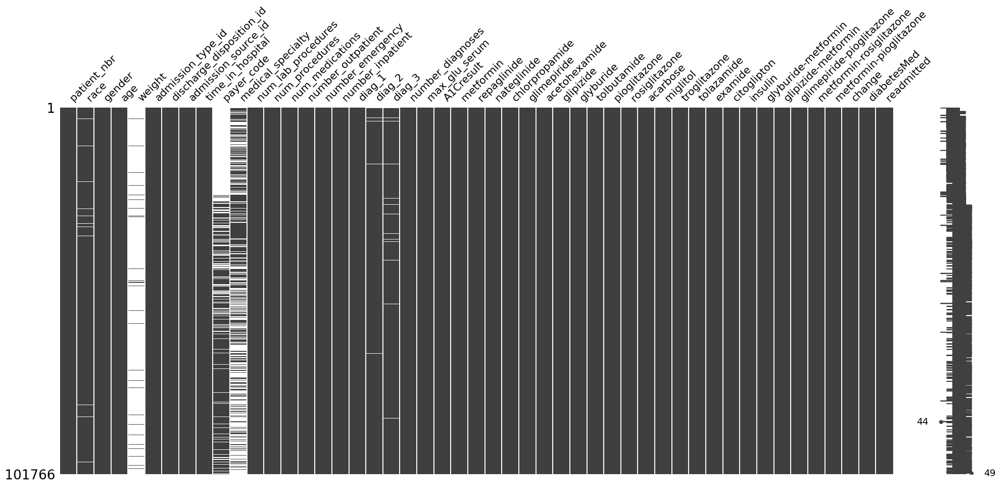

In [ ]:
msno.matrix(new_df)

#Check for duplicates.

In [ ]:
new_df.duplicated().sum()

0

There are no duplicates.

#Drop unnecessary columns.

In [ ]:
new_df.columns

Index(['patient_nbr', 'race', 'gender', 'age', 'weight', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'payer_code', 'medical_specialty', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'max_glu_serum', 'A1Cresult', 'metformin',
       'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

In [ ]:
# Dropping the columns which are not required
new_df.drop(['admission_type_id', 'discharge_disposition_id', 'admission_source_id', 'payer_code',  'medical_specialty', 'diag_1', 'diag_2', 'diag_3', 'patient_nbr', 'weight'], axis=1, inplace=True)

Weight column is dropped because 96.8% of the data is missing and replacing values would lead to misrepresentation of the data because the weights of most individuals are unknown. There are 49% of values missing from the medical_specialty column and 39% of values missing from the payer_code column, which are also dropped. Race column was not dropped because only 0.02% of data is missing.
ids are dropped because they are identifiers that do not provide any significant value to the prediction model.

Check to see if the columns are dropped.

In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101766 entries, 2278392 to 443867222
Data columns (total 39 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      99493 non-null   object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   time_in_hospital          101766 non-null  int64 
 4   num_lab_procedures        101766 non-null  int64 
 5   num_procedures            101766 non-null  int64 
 6   num_medications           101766 non-null  int64 
 7   number_outpatient         101766 non-null  int64 
 8   number_emergency          101766 non-null  int64 
 9   number_inpatient          101766 non-null  int64 
 10  number_diagnoses          101766 non-null  int64 
 11  max_glu_serum             101766 non-null  object
 12  A1Cresult                 101766 non-null  object
 13  metformin                 101766 non-null  object


In [ ]:
new_df.head(10)

,race,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
encounter_id,,,,,,,,,,,,,,,,,,,,,
2278392,Caucasian,Female,[0-10),1,41,0,1,0,0,0,...,No,No,No,No,No,No,No,No,No,NO
149190,Caucasian,Female,[10-20),3,59,0,18,0,0,0,...,No,Up,No,No,No,No,No,Ch,Yes,>30
64410,AfricanAmerican,Female,[20-30),2,11,5,13,2,0,1,...,No,No,No,No,No,No,No,No,Yes,NO
500364,Caucasian,Male,[30-40),2,44,1,16,0,0,0,...,No,Up,No,No,No,No,No,Ch,Yes,NO
16680,Caucasian,Male,[40-50),1,51,0,8,0,0,0,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
35754,Caucasian,Male,[50-60),3,31,6,16,0,0,0,...,No,Steady,No,No,No,No,No,No,Yes,>30
55842,Caucasian,Male,[60-70),4,70,1,21,0,0,0,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
63768,Caucasian,Male,[70-80),5,73,0,12,0,0,0,...,No,No,No,No,No,No,No,No,Yes,>30
12522,Caucasian,Female,[80-90),13,68,2,28,0,0,0,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


#Filling values for missing data.

Check for the most frequent occurrence of race type (mode)

In [ ]:
print (f'{round(new_df["race"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="race", title='Race', width=500, height=500)
fig.show()

Caucasian          76.49
AfricanAmerican    19.31
Hispanic            2.05
Other               1.51
Asian               0.64
Name: race, dtype: float64


Replacing null values in the race column because only 0.02% is missing and it may be an important variable for the model. Replacing values with Caucasian because it is the mode for the race column.

In [ ]:
new_df.fillna('Caucasian', inplace=True)

Check that null values are replaced.
Check for an increase in the number of Caucasian to confirm that null values are filled with Caucasian.

In [ ]:
#Check that null values are replaced.
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101766 entries, 2278392 to 443867222
Data columns (total 39 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101766 non-null  object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   time_in_hospital          101766 non-null  int64 
 4   num_lab_procedures        101766 non-null  int64 
 5   num_procedures            101766 non-null  int64 
 6   num_medications           101766 non-null  int64 
 7   number_outpatient         101766 non-null  int64 
 8   number_emergency          101766 non-null  int64 
 9   number_inpatient          101766 non-null  int64 
 10  number_diagnoses          101766 non-null  int64 
 11  max_glu_serum             101766 non-null  object
 12  A1Cresult                 101766 non-null  object
 13  metformin                 101766 non-null  object


In [ ]:
print (f'{round(new_df["race"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="race", title='Race', width=500, height=500)
fig.show()

Caucasian          77.01
AfricanAmerican    18.88
Hispanic            2.00
Other               1.48
Asian               0.63
Name: race, dtype: float64


Creating csv file for cleaned dataset

In [ ]:
new_df.to_csv('clean_diabetes_data.csv')

#End of data cleaning

#Summary

##Data Cleaning Steps

**Data Cleaning Steps: **
1. Install and import required libraries
2. Load csv containing data
3. Examine 10 rows of data
4. From the 10 rows examined, ‘?’ instead of values was identified
5. Replace '?' with NaN.
6. Check columns, data types and null values.
7. Identify columns with missing values and determine the amount or percentage of values missing from each of the columns.
Columns with missing values are race, weight, payer_code, medical_specialty, diag_1, diag_2 and diag_3.
8. Visualize the missing data
9. Check for duplicates.
10. Drop the columns that are not necessary:
new_df.drop(['admission_type_id', 'discharge_disposition_id', 'admission_source_id', 'payer_code',  'medical_specialty', 'diag_1', 'diag_2', 'diag_3', 'patient_nbr', 'weight'], axis=1, inplace=True)

11. Check to see if the columns are dropped.
12. Fill in values for the column with the missing data that was not dropped.
13. Replace null values in the race column because only 0.02% is missing and it may be an important variable for the model.
14. Replacing values with Caucasian because it is the mode for the race columns.
15. Check that null values are replaced.
16. Check for an increase in the number of Caucasian to confirm that null values are filled with Caucasian.
17. Create csv file for cleaned dataset




##Insights

Weight column is dropped because 96.8% of the data is missing and replacing values would lead to misrepresentation of the data because the weights of most individuals are unknown. There are 49% of values missing from the medical_specialty column and 39% of values missing from the payer_code column, which were also dropped.  ids are dropped because they are identifiers that do not provide any significant value to the prediction model. Race column was not dropped because only 0.02% of data is missing.

The most important graph for data cleaning is the bar graph that displays the missing data for each of the columns in the dataset because it allows for missing values to be easily seen and compared with other columns.  To fill in the missing data for race, it is found that Cacasians are the most affected by diabetes when compared to other races.



#EDA

In [ ]:
new_df.columns

In [ ]:
new_df.info()

#Skewness

In [ ]:
categorical = ['race', 'gender', 'age', 'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone','metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted']

numerical = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']

In [ ]:
diabetes[numerical].describe()

Based on the mean & median score differences, we can expect

An example of slightly left skew on the 'num_lab_procedures' (mean: 43.09 & median: 44)

An example of slightly right skew on the 'time_in_hospital' (mean: 4.39 & median: 4)



In [ ]:
new_df[numerical].skew()

Based on the result, num_lab_procedures and number_diagnoses are slightly left skew (negative) and the others features have right tail (positively) skewed shape distribution.



#Univariate Analysis

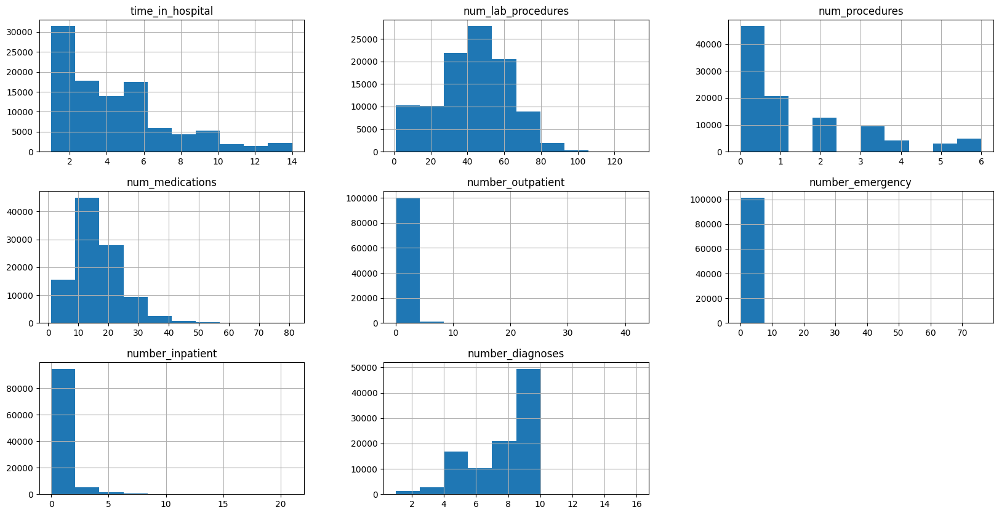

In [ ]:
new_df[numerical].hist(figsize=(20,10));

All are right skew except for number_diagnoses and num_lab_procedures. number_diagnoses and num_lab_procedures are left skew.  Data are not equally distributed.

#Categorical Features
categorical = ['race', 'gender', 'age', 'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide', 'examide', 'citoglipton', 'insulin', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone','metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted']


Race

In [ ]:
print (f'{round(new_df["race"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="race", title='Race', width=500, height=500)
fig.show()

Caucasian          76.49
AfricanAmerican    19.31
Hispanic            2.05
Other               1.51
Asian               0.64
Name: race, dtype: float64


The data indicate that Caucasians are most affected by diabetes and the African American. Asians are the least affected by diabetes.

Gender

In [ ]:
print (f'{round(new_df["gender"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="gender", title='Gender', width=500, height=500)
fig.show()

Female             53.76
Male               46.24
Unknown/Invalid     0.00
Name: gender, dtype: float64


Diabetes affected females more than men. The difference between females and males is small.

Age

In [ ]:
print (f'{round(new_df["age"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="age", title='Age', width=500, height=500)
fig.show()

[70-80)     25.62
[60-70)     22.09
[50-60)     16.96
[80-90)     16.90
[40-50)      9.52
[30-40)      3.71
[90-100)     2.74
[20-30)      1.63
[10-20)      0.68
[0-10)       0.16
Name: age, dtype: float64


Diabetes affect individuals between the ages of 70-80 years old the most and then 60-70 years old.

In [ ]:
print (f'{round(new_df["max_glu_serum"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x='max_glu_serum', title='max_glu_serum', width=500, height=500)
fig.show()

None    94.75
Norm     2.55
>200     1.46
>300     1.24
Name: max_glu_serum, dtype: float64


Glucose serum is not usually measured.

A1Cresult

In [ ]:
print (f'{round(new_df["A1Cresult"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="A1Cresult", title='A1Cresult', width=500, height=500)
fig.show()

None    83.28
>8       8.07
Norm     4.90
>7       3.75
Name: A1Cresult, dtype: float64


A1C is not usually measured.

In [ ]:
print (f'{round(new_df["change"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="change", title='change', width=500, height=500)
fig.show()

No    53.8
Ch    46.2
Name: change, dtype: float64


There is mostly no change in diabetic medications. There is a change in diabetic medications with a count of 41k.

In [ ]:
print (f'{round(new_df["insulin"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="insulin", title='insulin', width=500, height=500)
fig.show()

No        46.56
Steady    30.31
Down      12.01
Up        11.12
Name: insulin, dtype: float64


There's a large count of not perscribing insulin to treat diabetes. Once perscribe the dosages mostly remain steady.

In [ ]:
print (f'{round(new_df["metformin"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="metformin", title='metformin', width=500, height=500)
fig.show()

No        80.36
Steady    18.03
Up         1.05
Down       0.57
Name: metformin, dtype: float64


There's a large count of not perscribing metformin to treat diabetes. Once perscribe the dosages mostly remain steady.

In [ ]:
print (f'{round(new_df["repaglinide"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="repaglinide", title='repaglinide', width=500, height=500)
fig.show()

No        98.49
Steady     1.36
Up         0.11
Down       0.04
Name: repaglinide, dtype: float64


There's a large count of not perscribing repaglinide to treat diabetes. Once perscribe the dosages mostly remain steady.

In [ ]:
print (f'{round(new_df["chlorpropamide"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="chlorpropamide", title='chlorpropamide', width=500, height=500)
fig.show()

No        99.92
Steady     0.08
Up         0.01
Down       0.00
Name: chlorpropamide, dtype: float64


There's a large count of not perscribing chlorpropamide to treat diabetes. Once perscribe the dosages mostly remain steady.

In [ ]:
print (f'{round(new_df["acetohexamide"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="acetohexamide", title='acetohexamide', width=500, height=500)
fig.show()

No        100.0
Steady      0.0
Name: acetohexamide, dtype: float64


 Acetohexamide has not been perscribed to treat diabetes.

In [ ]:
fig = px.histogram(new_df, x="diabetesMed", title='Diabetes Medication', width=400, height=400)
fig.show()

Most individuals with diabetes are perscribed diabetes medication.

Readmitted

In [ ]:
print (f'{round(new_df["readmitted"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="readmitted", title='Readmitted', width=500, height=500)
fig.show()

NO     53.91
>30    34.93
<30    11.16
Name: readmitted, dtype: float64


There's 54.86k of patients not readmitted and 35.55k of patients readmitted less that 30 days and 11.36k of patients readmitted greater that 30 days.

In [ ]:
print (f'{round(new_df["time_in_hospital"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(new_df, x="time_in_hospital", title='time_in_hospital', width=500, height=500)
fig.show()

3     17.45
2     16.93
1     13.96
4     13.68
5      9.79
6      7.41
7      5.76
8      4.31
9      2.95
10     2.30
11     1.82
12     1.42
13     1.19
14     1.02
Name: time_in_hospital, dtype: float64


Most length of stay in the hospital is 3 days and the next highest number of stay is 2 days.